## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Setup

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

output_images_path = './output_images/'

# CV2 color space (BGR) will be used for all computer vision calculation
# For matplotlib inline images, conversion to RGB will be used

def evaluate_polynomial(input_variable, coefficients): 
    output = coefficients[0]*input_variable**2 + coefficients[1]*input_variable + coefficients[2]
    return output

## Camera Calibration

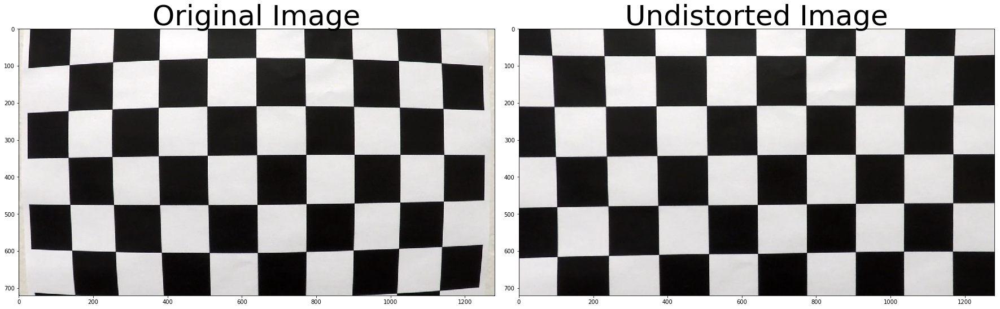

In [3]:
# A function that takes a glob API file name, number of chessboard 
# corners in x direction, and number of chessboard corners in y 
# direction to calculate camera matrix and distortion coefficients
# from calibration images of that file name
def camera_calibration(calibration_image_names, nx, ny):
    # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(calibration_image_names)
    # fig = plt.figure(figsize=(10,len(images)*10)) #debug code
    # i = 1 #debug code

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

    #         # debug code
    #         # Draw and display the corners
    #         img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
    #         ax = fig.add_subplot(len(images), 1, i)
    #         ax.imshow(img)
    #         i=i+1

    #plt.show()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return mtx, dist

# A function that takes an image, camera matrix, and distortion 
# coefficients to perform image distortion correction and 
# returns the undistorted image
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# Compute the camera matrix and distortion coefficients and un-distort 
# one of the calibration images
cal_image_names = './camera_cal/calibration*.jpg'
nx = 9
ny = 6
cam_mtx, dist_coef = camera_calibration(cal_image_names, nx, ny)
cal_img = cv2.imread('./camera_cal/calibration1.jpg')
undist_cal_img = undistort(cal_img, cam_mtx, dist_coef)

# Show and save distortion corrected calibration image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(cal_img,cv2.COLOR_BGR2RGB))
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(cv2.cvtColor(undist_cal_img,cv2.COLOR_BGR2RGB))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig(output_images_path + 'undistort_output.png')

## Pipeline Functions

In [5]:
# A function that takes an image, lightness threshold, saturation threshold, and Sobel X 
# threshold to generate a binary image
def generate_binary_image(img, l_thresh=(0, 255), s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the channels
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    ls_binary = np.zeros_like(s_channel)
    ls_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1]) & (l_channel >= l_thresh[0]) & (l_channel <= l_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack((sxbinary, np.zeros_like(sxbinary), ls_binary)) * 255
    #color_binary = np.dstack((s_channel, s_channel, s_channel)) * 255 #debug code
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(ls_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary, color_binary


# Warp an image from source to destination and return the warped image
def warp(img, src, dst):
    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    return warped, M


# Find and return the lane pixels from a warped binary image
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
#    # Create an output image to draw on and visualize the result
#    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin  
        win_xright_low = rightx_current - margin  
        win_xright_high = rightx_current + margin  
        
#        # Draw the windows on the visualization image
#         cv2.rectangle(out_img,(win_xleft_low,win_y_low),
#         (win_xleft_high,win_y_high),(0,255,0), 2) 
#         cv2.rectangle(out_img,(win_xright_low,win_y_low),
#         (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### Identify the nonzero pixels in x and y within the window ###
        good_left_inds = np.where((nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high) & (nonzeroy >= win_y_low) & (nonzeroy < win_y_high))[0]
        good_right_inds = np.where((nonzerox >= win_xright_low) & (nonzerox < win_xright_high) & (nonzeroy >= win_y_low) & (nonzeroy < win_y_high))[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        #pass # Remove this when you add your function

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty#, out_img


# Fit polynomials for the two lane in a warped binary image and return an image for plotting
def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty = find_lane_pixels(binary_warped)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img


# Fit polynomials from lane pixels and pixel-to-meter conversion ratios, and return 
# polynomials coefficients for both the pixel space and meter space
def fit_polynomial_combo(leftx, lefty, rightx, righty, ym_per_pix, xm_per_pix):
    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)
    
    ##### Fit new polynomials to x,y in world space #####
    ##### Utilize `ym_per_pix` & `xm_per_pix` here #####
    left_fit_cr = np.polyfit(lefty*ym_per_pix,leftx*xm_per_pix,2)
    right_fit_cr = np.polyfit(righty*ym_per_pix,rightx*xm_per_pix,2)
    
    return left_fit, right_fit, left_fit_cr, right_fit_cr


# Take the left and right lane line fits and pixel-to-meter conversion ratios, and
# calculate and return radius of curvature and lane center offset (in meters)
def measure_curvature_real(left_fit_cr, right_fit_cr, shape, ym_per_pix, xm_per_pix):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = shape[0]
    y_eval_real = y_eval*ym_per_pix
    
    ##### Calculation of R_curve (radius of curvature) #####
    left_curverad = np.sqrt((1 + (2*left_fit_cr[0]*y_eval_real + left_fit_cr[1])**2)**3) / np.absolute(2*left_fit_cr[0])  ## Implement the calculation of the left line here
    right_curverad = np.sqrt((1 + (2*right_fit_cr[0]*y_eval_real + right_fit_cr[1])**2)**3) / np.absolute(2*right_fit_cr[0])  ## Implement the calculation of the right line here
    
    # Calculate lane center offset
    left_x_eval_real = evaluate_polynomial(y_eval_real, left_fit_cr)
    right_x_eval_real = evaluate_polynomial(y_eval_real, right_fit_cr)
    center_x_eval_real = (left_x_eval_real + right_x_eval_real)/2
    center_offset = shape[1]/2 * xm_per_pix - center_x_eval_real
    
    return left_curverad, right_curverad, center_offset


# Take undistorted image, lane pixels, left and right lane line fits, radius 
# of curvature, and lane center offset, and return an image with the lane pixels
# and lane area, and curvature and offset values on top of it
def generate_lane_overlay(img, leftx, lefty, rightx, righty, left_fit, right_fit, left_curverad, right_curverad, center_offset, debug_string='debug'):
    mask = np.zeros_like(img)
    
    # Add the lane line pixels to the mask
    mask[lefty, leftx] = [255, 0, 0]
    mask[righty, rightx] = [0, 0, 255]
    
    # Add (to the mask) the lane area defined by left and right lane line polynomial fits
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    pts_x = np.append(left_fitx + 10,np.flipud(right_fitx - 10))
    pts_y = np.append(ploty,np.flipud(ploty))
    area_vertices = np.array([np.transpose([pts_x,pts_y])],dtype=np.int32)
    mask = cv2.fillPoly(mask, area_vertices, (0,128,0))
    
    # Define the curvature and center-offset text
    text1 = 'Radius of Curvature = ' + "%.2f" % ((left_curverad+right_curverad)/2) + '(m)'
    if center_offset < 0:
        text2 = 'Vehicle is ' + "%.3f" % (-center_offset) + 'm left of center'
    elif center_offset > 0:
        text2 = 'Vehicle is ' + "%.3f" % center_offset + 'm right of center'
    else:
        text2 = 'Vehicle is at the center'
    
    # Add the image, warped mask, and text
    mask_warped, M = warp(mask, destination, source)
    out_img = cv2.addWeighted(img, 0.8, mask_warped, 1, 0) 
    font = cv2.FONT_HERSHEY_SIMPLEX
    out_img = cv2.putText(out_img, text1, (50,50), font, 1, (255,255,255))
    out_img = cv2.putText(out_img, text2, (50,100), font, 1, (255,255,255))
    out_img = cv2.putText(out_img, debug_string, (50,150), font, 1, (255,255,255))
    
    return out_img

## Pipeline (Test Images)

./test_images/test1.jpg 351.302414089 m 469.409243767 m -0.245242770488 m
./test_images/straight_lines1.jpg 80855.1793722 m 1495.51432377 m -0.0376898644418 m
./test_images/test6.jpg 950.663085637 m 1206.21042464 m -0.258290560372 m
./test_images/test2.jpg 405.567469676 m 297.415942363 m -0.345071670797 m
./test_images/test3.jpg 451.498898658 m 518.304379282 m -0.200944494379 m
./test_images/test5.jpg 432.080866167 m 234.134316597 m -0.120625446564 m
./test_images/straight_lines2.jpg 73298.1402337 m 2689.47227175 m -0.076617677498 m
./test_images/test4.jpg 810.829970196 m 35.1742753622 m -2.87491895519 m


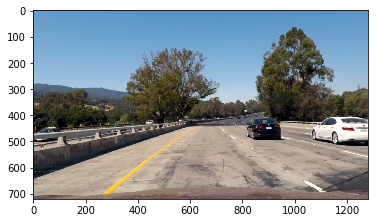

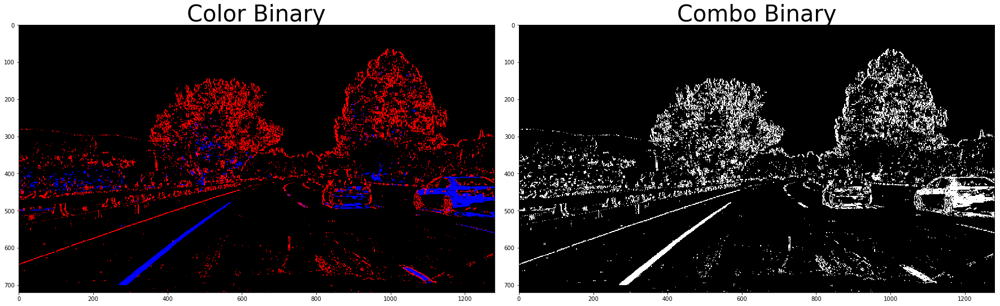

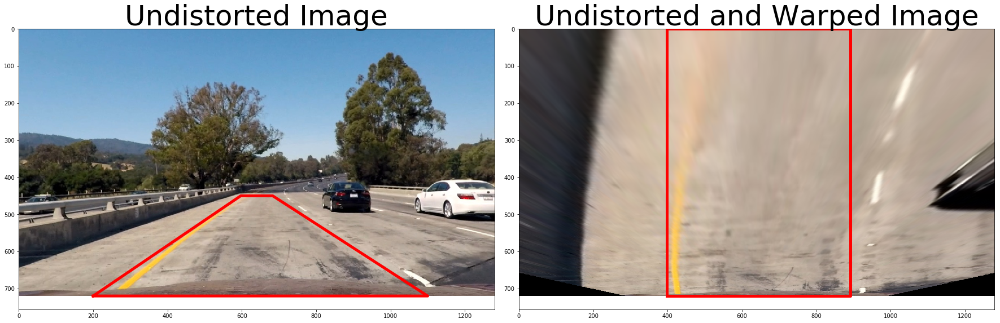

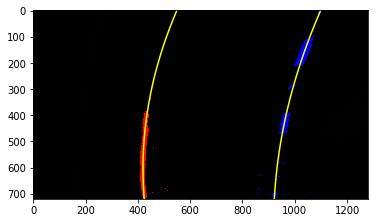

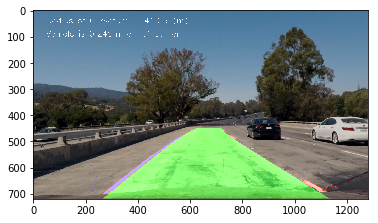

...

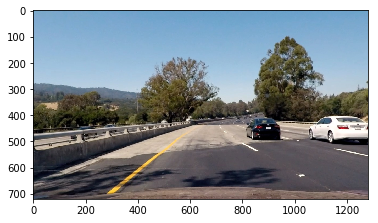

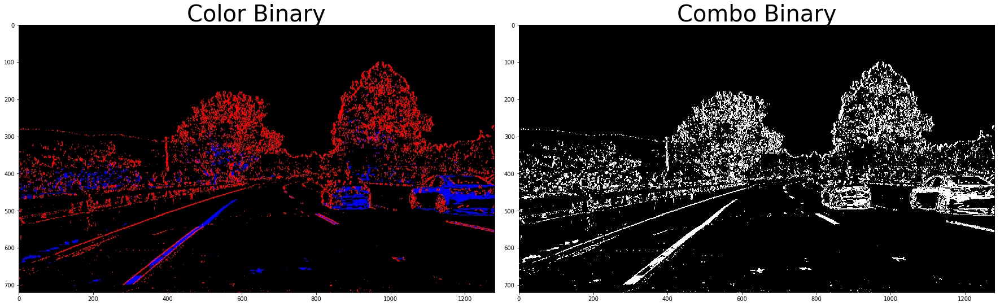

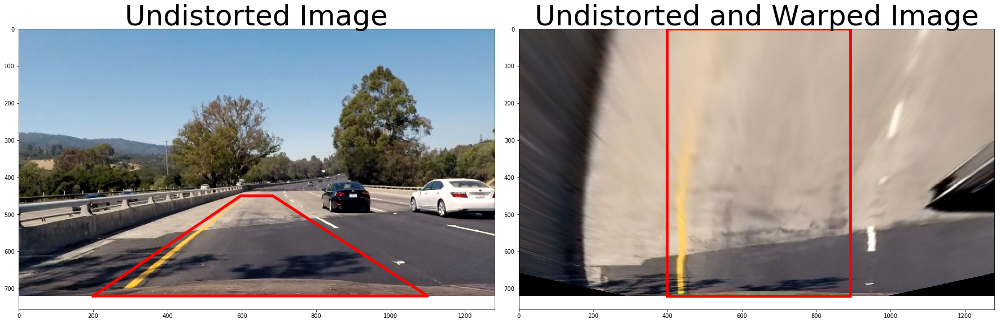

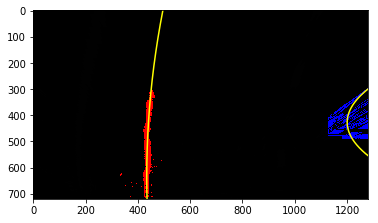

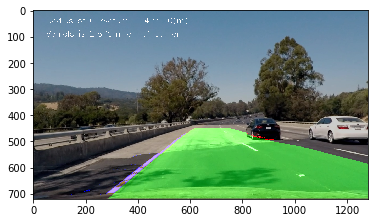

In [7]:
# Calibrate the camera
cal_image_names = './camera_cal/calibration*.jpg'
nx = 9
ny = 6
cam_mtx, dist_coef = camera_calibration(cal_image_names, nx, ny)

# Define source and destination points
bottom_left = [200,720]
bottom_right = [1100,720]
top_right = [683,450]
top_left = [597,450]

dst_left_x = (top_left[0]+bottom_left[0])/2
dst_right_x = (top_right[0]+bottom_right[0])/2
dst_bottom_left = [dst_left_x,720]
dst_bottom_right = [dst_right_x,720]
dst_top_right = [dst_right_x,0]
dst_top_left = [dst_left_x,0]

source = np.float32([bottom_left, bottom_right, top_right, top_left])
destination = np.float32([dst_bottom_left, dst_bottom_right, dst_top_right, dst_top_left])

# Define conversions in x and y from pixels space to meters
ym_per_pix = 3/70 # meters per pixel in y dimension
xm_per_pix = 3.7/500 # meters per pixel in x dimension

# A function that process a test image, and then plot and save output from each
# step of the pipeline
def process_test_image(test_image_name):
    # Save output files to a directory with the same name as the test image name
    save_dir = output_images_path + test_image_name[14:-4] + '/'

    test_image = cv2.imread(test_image_name)
    
    # Undistort
    undist_test_image = undistort(test_image, cam_mtx, dist_coef)
    # Plot and save the undistorted output
    undist_test_image_RGB = cv2.cvtColor(undist_test_image,cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.imshow(undist_test_image_RGB)
    cv2.imwrite(save_dir + 'distortion_corrected_image.jpg', undist_test_image)

    # Binary
    combined_binary, color_binary = generate_binary_image(undist_test_image)
    # Plot and save the binary output
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(color_binary)
    ax1.set_title('Color Binary', fontsize=40)
    ax2.imshow(combined_binary, cmap='gray')
    ax2.set_title('Combo Binary', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    cv2.imwrite(save_dir + 'binary_combo.jpg', combined_binary*255)

    # Warp
    top_down, perspective_M = warp(undist_test_image, source, destination)
    # Plot and save the warp output (of the undistorted test image)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(undist_test_image_RGB)
    ax1.set_title('Undistorted Image', fontsize=50)
    ax1.plot(np.append(source[:,0],source[0,0]),np.append(source[:,1],source[0,1]),'r',lw=5) # Plot source points
    ax2.imshow(cv2.cvtColor(top_down, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    ax2.plot(np.append(destination[:,0],destination[0,0]),np.append(destination[:,1],destination[0,1]),'r',lw=5) # Plot destination points
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig(save_dir + 'warped.jpg')

    # Fit
    plt.figure()
    binary_warped, perspective_M = warp(combined_binary, source, destination)
    out_img = fit_polynomial(binary_warped)
    # Plot and save the fit output
    plt.imshow(out_img)
    plt.savefig(save_dir + 'color_fit_lines.jpg')

    # Calculate (in meters) and print the radius of curvature for both lane lines and the lane center offset
    leftx, lefty, rightx, righty = find_lane_pixels(binary_warped)
    left_fit, right_fit, left_fit_cr, right_fit_cr = fit_polynomial_combo(leftx, lefty, rightx, righty,ym_per_pix, xm_per_pix)
    left_curverad, right_curverad, center_offset = measure_curvature_real(left_fit_cr, right_fit_cr, binary_warped.shape, ym_per_pix, xm_per_pix)
    print(test_image_name, left_curverad, 'm', right_curverad, 'm', center_offset, 'm')

    # Draw and save pipeline output
    output = generate_lane_overlay(undist_test_image, leftx, lefty, rightx, righty, left_fit, right_fit, left_curverad, right_curverad, center_offset, ' ')
    plt.figure()
    plt.imshow(cv2.cvtColor(output,cv2.COLOR_BGR2RGB))
    cv2.imwrite(save_dir + 'output.jpg', output)

    
# Actually processing the test image     
#images = glob.glob('./test_images/test1.jpg')    
images = glob.glob('./test_images/*.jpg') # batch process
for fname in images:
    process_test_image(fname)

## Pipeline (Video)

In [8]:
# Calibrate the camera
cal_image_names = './camera_cal/calibration*.jpg'
nx = 9
ny = 6
cam_mtx, dist_coef = camera_calibration(cal_image_names, nx, ny)

# Define source and destination points
bottom_left = [200,720]
bottom_right = [1100,720]
top_right = [683,450]
top_left = [597,450]

dst_left_x = (top_left[0]+bottom_left[0])/2
dst_right_x = (top_right[0]+bottom_right[0])/2
dst_bottom_left = [dst_left_x,720]
dst_bottom_right = [dst_right_x,720]
dst_top_right = [dst_right_x,0]
dst_top_left = [dst_left_x,0]

source = np.float32([bottom_left, bottom_right, top_right, top_left])
destination = np.float32([dst_bottom_left, dst_bottom_right, dst_top_right, dst_top_left])

# Define conversions in x and y from pixels space to meters
ym_per_pix = 3/70 # meters per pixel in y dimension
xm_per_pix = 3.7/500 # meters per pixel in x dimension

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # number of fail frames before reset
        self.fail_max = 3
        # counter for number of fail frames
        self.fail_counter = 3 # force a reset at the beginning of the video
        
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  

# Find and return the lane pixels from a warped binary image and prior lane line fits
def search_around_poly(binary_warped, left_fit, right_fit):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    return leftx, lefty, rightx, righty

def process_image(image):
    # Undistort
    undist_image = undistort(image, cam_mtx, dist_coef)

    # Binary
    combined_binary, color_binary = generate_binary_image(undist_image,l_thresh=(100, 255),s_thresh=(100, 255), sx_thresh=(50, 100))

    # Warp
    binary_warped, perspective_M = warp(combined_binary, source, destination)
    
    # Find lane pixels (reset if too many frames had failed before)
    if (left_line.fail_counter < left_line.fail_max) and (right_line.fail_counter < right_line.fail_max):
        leftx, lefty, rightx, righty = search_around_poly(binary_warped, left_line.current_fit, right_line.current_fit)
    else:
        leftx, lefty, rightx, righty = find_lane_pixels(binary_warped)
    #leftx, lefty, rightx, righty, lane_pixels_image = find_lane_pixels(binary_warped) # debug code
    
    # Fit
    try:
    	left_fit, right_fit, left_fit_cr, right_fit_cr = fit_polynomial_combo(leftx, lefty, rightx, righty, ym_per_pix, xm_per_pix)
    except:
        # Avoids an error if no lane pixels were found
        print('The function failed to fit a line!')
        left_fit, right_fit = left_fit_cr = right_fit_cr = np.zeros(3)
    
    # Calculate (in meters) and print the radius of curvature for both lane lines and the lane center offset
    left_curverad, right_curverad, center_offset = measure_curvature_real(left_fit_cr, right_fit_cr, binary_warped.shape, ym_per_pix, xm_per_pix)
    
    # Checking that the lanes have similar curvature (same order of magnitude)
    curvature_similarity = left_curverad/right_curverad
    curvature_check = (curvature_similarity < 10 and curvature_similarity >0.1)
    
    # Checking that the lanes are separated by approximately 3.7 horizontally
    y_eval = image.shape[0]
    left_x_eval = evaluate_polynomial(y_eval, left_fit)
    right_x_eval = evaluate_polynomial(y_eval, right_fit)
    line_distance = np.absolute(left_x_eval - right_x_eval) * xm_per_pix
    line_distance_check = (line_distance < 4.2 and line_distance > 3.2)
    
    # Checking that the lanes are roughly parallel (slopes are within one degree of each other)
    left_x_eval_zero = evaluate_polynomial(0, left_fit)
    right_x_eval_zero = evaluate_polynomial(0, left_fit)
    left_slope = (left_x_eval - left_x_eval_zero) / (y_eval - 0)
    right_slope = (right_x_eval - right_x_eval_zero) / (y_eval - 0)
    slope_similarity = np.absolute(left_slope - right_slope)
    slope_check = slope_similarity < np.tan(1*180/np.pi)
    
    # Do sanity check and decide whether this frame has failed
    # Radius of curvature can be wildly different for straightlines, but slope should be similar 
    if ((curvature_check or slope_check) and line_distance_check):
        left_line.fail_counter = 0
        right_line.fail_counter = 0
        left_line.detected = True
        right_line.detected = True
        left_line.current_fit = left_fit
        right_line.current_fit = right_fit
        left_line.radius_of_curvature = left_curverad
        right_line.radius_of_curvature = right_curverad
        left_line.allx = leftx
        left_line.ally = lefty
        right_line.allx = rightx
        right_line.ally = righty          
    else:
        left_line.fail_counter += 1
        right_line.fail_counter += 1
        left_line.detected = False
        right_line.detected = False
    
    # Draw output
    #debug_string = 'curvature_check '+str(round(curvature_similarity,2))+' line_distance_check '+str(round(line_distance,2))+' slope_check '+str(round(slope_similarity,2))
    debug_string = ' '
    #out_img = warp(color_binary, source, destination) # debug code
    output = generate_lane_overlay(undist_image, left_line.allx, left_line.ally, right_line.allx, right_line.ally, left_line.current_fit, right_line.current_fit, left_line.radius_of_curvature, right_line.radius_of_curvature, center_offset, debug_string)
 
    return output

In [9]:
# Process project video
left_line = Line()
right_line = Line()

project_output = './project_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
project_video = VideoFileClip("./project_video.mp4")
project_clip = project_video.fl_image(process_image) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video ./project_output.mp4
[MoviePy] Writing video ./project_output.mp4


100%|█████████▉| 1260/1261 [05:29<00:00,  3.93it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_output.mp4 

CPU times: user 2min 45s, sys: 34.8 s, total: 3min 20s
Wall time: 5min 32s


In [ ]:
# (Failed attempt to) Process challenge video
left_line = Line()
right_line = Line()

challenge_output = './challenge_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
challenge_video = VideoFileClip("./challenge_video.mp4")
challenge_clip = challenge_video.fl_image(process_image).subclip(0,2) #NOTE: this function expects color images!!
%time challenge_clip.write_videofile(challenge_output, audio=False)